In [56]:
import numpy as np
import pandas as pd
from volby.calc import Calc, Sim
from volby import utils
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from scipy import stats
import statsmodels.api as sm

In [57]:
seats = {"Praha": 24, "Stredocesky": 26, "Jihocesky": 13, "Plzensky": 11, "Karlovarsky": 5, "Ustecky": 13, "Liberecky": 8, "Kralovehradecky": 11, "Pardubicky": 10, "Vysocina": 10, "Jihomoravsky": 23, "Olomoucky": 12, "Zlinsky": 12, "Moravskoslezky": 22}
# get data from 2017 election
volby_2017 = pd.read_html("https://volby.cz/pls/ps2017/ps61?xjazyk=CZ&xv=1", attrs = {'class': 'table'}, index_col = 0, na_values = ["-"], thousands = "\xa0", encoding = "utf-8", decimal = ",")[0]
volby_2017 = volby_2017.apply(lambda x: x.astype(float), axis=1)
volby_2017 = volby_2017.iloc[np.arange(0,31), np.arange(1,volby_2017.shape[1])]
volby_2017.fillna(0, inplace = True)
volby2017 = volby_2017.to_dict()

In [58]:
#check the code is correct
# https://www.ih21.org/kalkulacka
v2017 = Calc(n_seats = seats, results = volby2017)
v2017.allocate_seats(threshold = 0.05, inplace = False, method="dhont")

,Praha,Stredocesky,Jihocesky,Plzensky,Karlovarsky,Ustecky,Liberecky,Kralovehradecky,Pardubicky,Vysocina,Jihomoravsky,Olomoucky,Zlinsky,Moravskoslezky
1 ODS,5,4,2,2,0,1,1,1,1,1,3,1,1,2
4 ČSSD,1,2,1,1,0,1,0,1,1,1,2,1,1,2
7 STAN,1,2,0,0,0,0,1,0,0,0,1,0,1,0
8 KSČM,1,2,1,1,0,1,0,1,1,1,2,1,1,2
15 Piráti,5,3,1,1,1,1,1,1,1,1,2,1,1,2
20 TOP 09,3,2,1,0,0,0,0,0,0,0,1,0,0,0
21 ANO,6,9,5,5,3,7,4,5,4,4,7,5,4,10
24 KDU-ČSL,1,0,1,0,0,0,0,1,1,1,2,1,1,1
29 SPD,1,2,1,1,1,2,1,1,1,1,3,2,2,3


In [59]:
#check this method  is correct as well
# https://www.ih21.org/kalkulacka
v2017.allocate_seats(threshold = 0.05, inplace = False, method="hb")

,Total
1 ODS,24
4 ČSSD,15
7 STAN,10
8 KSČM,16
15 Piráti,24
20 TOP 09,10
21 ANO,66
24 KDU-ČSL,12
29 SPD,23


### D'Hont

In [60]:
# simulate election with 8 parties, 4 smaller, 3 medium and one stronger
dhont = Sim(n_seats = seats, n_parties=8, alpha = np.array([4,5,5,8,10,11,15,20]), threshold = 0.05, method="dhont")
dhont.sim_one()

print("Prc votes {}".format(dhont.votes.sum(axis = 1) / np.sum(dhont.votes.sum(axis = 1))))
print("Prc seats {}".format(dhont.seats.sum(axis = 1) / np.sum(dhont.seats.sum(axis = 1))))

# simulate election
dhont.sim_multi(N = 5000)

Prc votes 0    0.046221
1    0.072307
2    0.060200
3    0.104335
4    0.111963
5    0.141663
6    0.196927
7    0.266384
dtype: float64
Prc seats 1    0.065
2    0.035
3    0.110
4    0.110
5    0.135
6    0.230
7    0.315
dtype: float64


Parties benefit when % vote is higher than 0.12


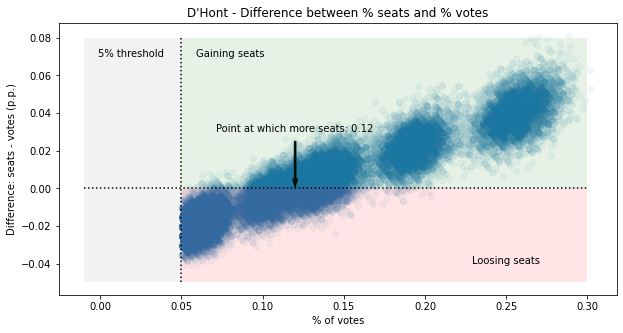

In [61]:
dhont_diff = dhont.sim["seats"] - dhont.sim["votes"]

# calculate when (on average) parties benefit
y = dhont_diff.flatten()
X = dhont.sim["votes"].flatten()
# select only cases which pass the threshold
y = y[X >= 0.05]
X = X[X >= 0.05]

#fit a model
X = sm.add_constant(X)
results = sm.OLS(y, X).fit()
a, b = results.params
y_plus = np.round(-1 * a/b, 2)
print("Parties benefit when % vote is higher than {}".format(y_plus))

#plot
fig, ax = plt.subplots(1,1, figsize = (10,5))
ax.scatter(X[:, 1], y, alpha = 0.05)
ax.arrow(y_plus, 0.025, dx = 0, dy = -0.02, color = "black")
ax.text(y_plus, 0.03, s = "Point at which more seats: {}".format(y_plus), horizontalalignment = "center")
ax.set_title("D'Hont - Difference between % seats and % votes")
ax.set_ylabel("Difference: seats - votes (p.p.)")
ax.set_xlabel("% of votes")
ax.plot(np.linspace(-0.01,0.3), np.linspace(0,0), color = "black", linestyle = ":")
ax.add_patch(Rectangle((-0.01, -0.05), 0.06, 0.13, facecolor = 'grey', alpha = 0.1))
ax.plot(np.linspace(0.05,0.05), np.linspace(-0.05,0.08), color = "black", linestyle = ":")
ax.add_patch(Rectangle((0.05, -0.05), 0.25, 0.05, facecolor = 'red', alpha = 0.1))
ax.add_patch(Rectangle((0.05, 0), 0.25, 0.08, facecolor = 'green', alpha = 0.1))
ax.text(0.019, 0.07, s = "5% threshold", horizontalalignment = "center")
ax.text(0.08, 0.07, s = "Gaining seats", horizontalalignment = "center")
ax.text(0.25, -0.04, s = "Loosing seats", horizontalalignment = "center")
plt.show()

### Hagenbach-Bischoff

In [64]:
# simulate election
hb = Sim(n_seats = seats, n_parties=8, alpha = np.array([4,5,5,8,10,11,15,20]), threshold = 0.05, method="hb")
hb.sim_multi(N=5000)

Parties benefit when % vote is higher than 0.1


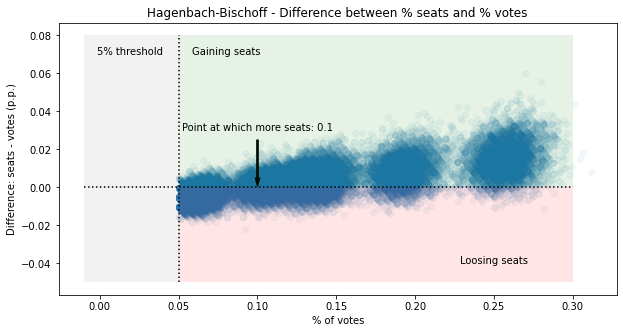

In [65]:
hb_diff = hb.sim["seats"] - hb.sim["votes"]

# calculate when (on average) parties benefit
y = hb_diff.flatten()
X = hb.sim["votes"].flatten()
# select only cases which pass the threshold
y = y[X >= 0.05]
X = X[X >= 0.05]

#fit a model
X = sm.add_constant(X)
results = sm.OLS(y, X).fit()
a, b = results.params
y_plus = np.round(-1 * a/b, 2)
print("Parties benefit when % vote is higher than {}".format(y_plus))

#plot
fig, ax = plt.subplots(1,1, figsize = (10,5))
ax.scatter(X[:, 1], y, alpha = 0.05)
ax.arrow(y_plus, 0.025, dx = 0, dy = -0.02, color = "black")
ax.text(y_plus, 0.03, s = "Point at which more seats: {}".format(y_plus), horizontalalignment = "center")
ax.set_title("Hagenbach-Bischoff - Difference between % seats and % votes")
ax.set_ylabel("Difference: seats - votes (p.p.)")
ax.set_xlabel("% of votes")
ax.plot(np.linspace(-0.01,0.3), np.linspace(0,0), color = "black", linestyle = ":")
ax.add_patch(Rectangle((-0.01, -0.05), 0.06, 0.13, facecolor = 'grey', alpha = 0.1))
ax.plot(np.linspace(0.05,0.05), np.linspace(-0.05,0.08), color = "black", linestyle = ":")
ax.add_patch(Rectangle((0.05, -0.05), 0.25, 0.05, facecolor = 'red', alpha = 0.1))
ax.add_patch(Rectangle((0.05, 0), 0.25, 0.08, facecolor = 'green', alpha = 0.1))
ax.text(0.019, 0.07, s = "5% threshold", horizontalalignment = "center")
ax.text(0.08, 0.07, s = "Gaining seats", horizontalalignment = "center")
ax.text(0.25, -0.04, s = "Loosing seats", horizontalalignment = "center")
plt.show()